In [6]:
from math import sqrt
import matplotlib.pyplot as plt
import numpy as np 
from scipy.special import agm
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

[0.13944506427344727, 0.0003696279529643576, 2.597096759870965e-09, -8.881784197001252e-16]
[1, 2, 3, 4]


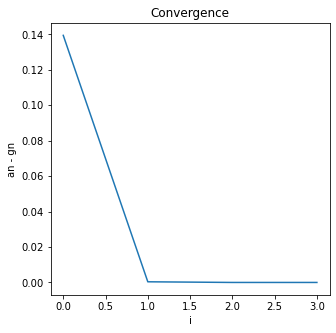

In [2]:
#Calculation for convergence graph to demonstrate after how many iterations will the grah converge 
def agm_tolerance_graph(a0, g0, tolerance=1e-10):
    an, gn = (a0 + g0) / 2.0, sqrt(a0 * g0)
    iteration = 0
    converge_value =[]
    iter_value =[]
    while abs(an - gn) > tolerance:
        an, gn = (an + gn) / 2.0, sqrt(an * gn)
        iteration += 1
        iter_value.append(iteration)
        converge_value.append(an-gn)
    return an, iter_value, converge_value

def plot_graph(func):
    (agm_value, iter_value, converge_value) = func(2, 14)
    print(converge_value)
    print(iter_value)
    fig, ax = plt.subplots(1,1, figsize = (5,5))
    ax.plot(converge_value);
    ax.set_title("Convergence");
    ax.set_ylabel("an - gn");
    ax.set_xlabel('i');
    
plot_graph(agm_tolerance_graph)    
    

In [3]:
#calculation of agm 
def agm_tolerance(a0, g0, tolerance=1e-10):
    an, gn = (a0 + g0) / 2.0, sqrt(a0 * g0)
    while abs(an - gn) > tolerance:
        an, gn = (an + gn) / 2.0, sqrt(an * gn)
    return an


In [49]:
#Calculating agm for every pair in the given range and plotting 3D graph
a = np.linspace(2,15,14)
b = np.linspace(15,2, 14)

ans = []
for_plot = []
for i, j in zip(a,b):
    ans =agm(i, j)
    for_plot.append(ans)
    print(ans)
#     plt.scatter(i,ans)



6.905671994268664
7.456153146418777
7.84230615535352
8.118605725526217
8.31095621061353
8.43316824600674
8.492639092812496
8.492639092812496
8.43316824600674
8.31095621061353
8.118605725526217
7.84230615535352
7.456153146418777
6.905671994268664


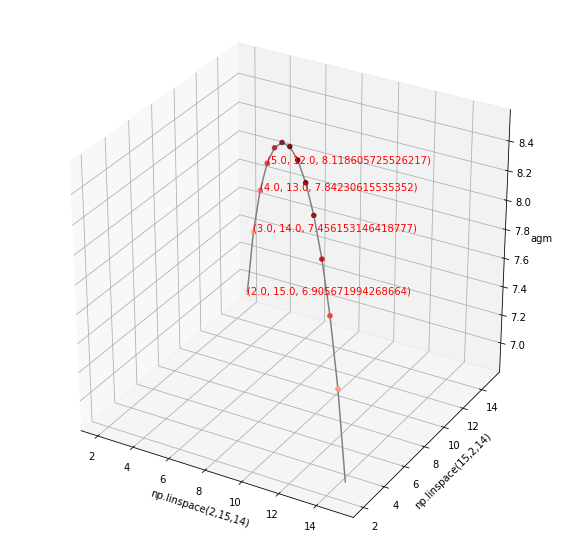

In [61]:
fig = plt.figure(figsize = (10,10))
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = for_plot
xline = np.linspace(2, 15, 14)
yline = np.linspace(15, 2, 14)
ax.plot3D(xline, yline, zline, 'gray')
xdata = xline
ydata = yline
zdata = zline
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Reds');
ax.set_xlabel("np.linspace(2,15,14)")
ax.set_ylabel("np.linspace(15,2,14)")
ax.set_zlabel("agm")

# for i,j,k in zip(a[7:-1],b[7:-1],for_plot[7:-1]):
#     ax.text(i,j,k, (i,j,k), color='red')

for i,j,k in zip(a[0:4],b[0:4],for_plot[0:4]):
    ax.text(i,j,k, (i,j,k), color='red')

In [24]:
"""from decimal import *
getcontext()
getcontext().prec = 6
print("agm: ", agm(24, 6))
Decimal(agm(24,6))"""

agm:  13.458171481725614


Decimal('13.4581714817256141714096884243190288543701171875')

In [20]:
#Trying to optimize this code by compromising over accuracy for speed.
#To speed up the process we can set our goal to get an error less than 0.01%
a, b = 24.0, 6.0
print("agm: ", agm(24, 6))

def agm_error_check(a0, g0):
    my_agm = a0
    count = 0
    t = 1
    actual = agm(a0, g0)
    iter_value = []
    converge_value = []
    '''
    error should be < 0.001
    and error = ((actual - my_agm)/actual)*100
    Therefore, my_agm = actual*(1 - 0.0001) = check
    '''
    check = actual*(1 - 0.009)
    print("check", check)
    iteration = 0
    my_agm, gn = (a0 + g0) / 2.0, sqrt(a0 * g0)
    # while abs(an - gn) > tolerance:
    while my_agm != actual:
        my_agm, gn = (my_agm + gn) / 2.0, sqrt(my_agm * gn)
        iteration += 1
        iter_value.append(iteration)
        converge_value.append(my_agm - gn)
        print(my_agm, end = ", ")
    return my_agm, iter_value, converge_value
print(agm_error_check(24, 6))       

agm:  13.458171481725614
check 13.337047938390084


13.5, 13.45820393249937, 13.458171481745177, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 13.458171481725616, 

KeyboardInterrupt: 

In [7]:
#Trying to use broadcasting for if the size of arrays entered is different 
a = np.array([[1.5], [3], [6]])

In [12]:
print(a, a.shape[0], a.shape[1])

[[1.5]
 [3. ]
 [6. ]] 3 1


In [13]:
b = np.array([6, 12, 24, 48]) 
print(b,b.shape[0])

[ 6 12 24 48] 4


In [14]:
agm(a, b)

array([[ 3.36454287,  5.42363427,  9.05798751, 15.53650756],
       [ 4.37037309,  6.72908574, 10.84726853, 18.11597502],
       [ 6.        ,  8.74074619, 13.45817148, 21.69453707]])

In [11]:
agm(6, 3)

4.370373093140721